Earthquake in Taiwan 2024
===
At April 4, about 7:55 AM, Earth quake stoke Taiwan seriously, and continuously. Let us to make an animation of this occurence, and thanks for the data downloaded from goverment, [Central Weather Administration](https://scweb.cwa.gov.tw/zh-tw/earthquake/data/). And use PCA to visulize the seismic fault in the series occurences.  



[src](https://www.geeksforgeeks.org/analyze-and-visualize-earthquake-data-in-python-with-matplotlib/)

In [ ]:
# install Traditional Chinese font surport
# TC Font avialed fron Google

!pip install -q git+https://github.com/cchuang2009/tw_matplotlib.git

  Preparing metadata (setup.py) ... done


In [ ]:

!apt-get install libgeos
!apt-get install libgeos-dev
!pip install -q https://github.com/matplotlib/basemap/archive/v1.2.0rel.tar.gz


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package libgeos
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgeos-dev is already the newest version (3.11.1-1~jammy0).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.
     / 132.4 MB 19.6 MB/s 0:00:13
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for basemap
ERROR: Could not build wheels for basemap, which is required to install pyproject.toml-based projects


In [ ]:
!pip install -q basemap
!pip install basemap-data-hires

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import tw_matplotlib
import seaborn as sns
from mpl_toolkits.basemap import Basemap


import plotly.express as px

import folium
from folium.plugins import HeatMap

import glob
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

# create sub-folder, earth-data, within woking place
folder= '/content/gdrive/MyDrive/2023/2023-2-Python-AI/earth-data/'


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


HomeWork
---
As previous mentioned, data are the focus of ML/AI. Everyone is asked to dowanload the earthquake data of Taiwan below and complete the left codes in the lecture.

Download earthquake data from [EarthQuake Data Download](https://scweb.cwa.gov.tw/zh-tw/earthquake/data/), from 2024 January to May and upload to the folder created above.

In [ ]:
file_list = glob.glob(folder + "/*.csv")

In [ ]:
# data start from the first line
# data are in Big5 encoding
# look the download, something is not necessary: skip

dfs=[]
for file in file_list:
    df=pd.read_csv(file, skiprows=1,encoding="big5")
    dfs.append(df)

df= pd.concat(dfs)



In [ ]:

df.head(2)

,編號,地震時間,經度,緯度,規模,深度,位置
0,小區域有感地震,2024-05-25 15:30:19,121.420,22.4425,4.2,21.3,臺東縣政府東南方 44.3 公里 (位於臺灣東南部海域)(臺灣東南部海域)
1,小區域有感地震,2024-05-25 13:30:50,121.674,24.2543,3.9,28.3,花蓮縣政府北北東方 29.7 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)


In [ ]:
# seperate DateTime, '地震時間', into 'Date' and 'Time', two features repectively:
splitted = df['地震時間'].str.split(' ', n=1, expand=True)

df['Date'] = splitted[0]
# neglect time smaller than second
df['Time'] = splitted[1].str[:-3]

# change format of Time in DataTime format
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')

# Also change the format of '地震時間'
df['地震時間'] = pd.to_datetime(df['地震時間'])
#df.drop('地震時間',axis=1,inplace=True)

In [ ]:
df.head(2)

,編號,地震時間,經度,緯度,規模,深度,位置
0,小區域有感地震,2024-05-25 15:30:19,121.420,22.4425,4.2,21.3,臺東縣政府東南方 44.3 公里 (位於臺灣東南部海域)(臺灣東南部海域)
1,小區域有感地震,2024-05-25 13:30:50,121.674,24.2543,3.9,28.3,花蓮縣政府北北東方 29.7 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)


In [ ]:
df1=df[['緯度	','']]

<class 'pandas.core.frame.DataFrame'>
Index: 1623 entries, 0 to 1399
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   編號      1623 non-null   object        
 1   地震時間    1623 non-null   datetime64[ns]
 2   經度      1623 non-null   float64       
 3   緯度      1623 non-null   float64       
 4   規模      1623 non-null   float64       
 5   深度      1623 non-null   float64       
 6   位置      1623 non-null   object        
 7   Date    1623 non-null   datetime64[ns]
 8   Time    1623 non-null   object        
dtypes: datetime64[ns](2), float64(4), object(3)
memory usage: 191.3+ KB


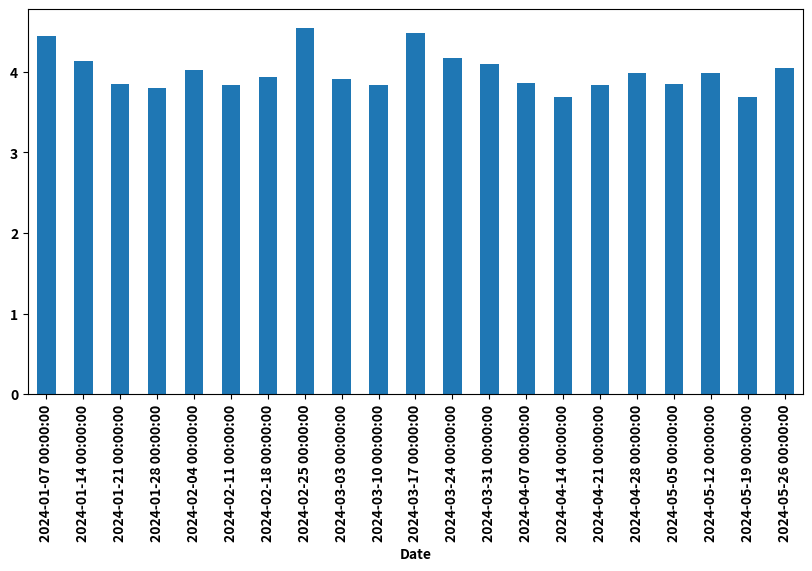

In [ ]:
# display the frequencies of quakes weekly

plt.figure(figsize=(10, 5))
#x = df.groupby('week').mean()['規模']
x = df.groupby([pd.Grouper(key='Date', freq='W')])['規模'].mean()

x.plot.bar()
plt.show()

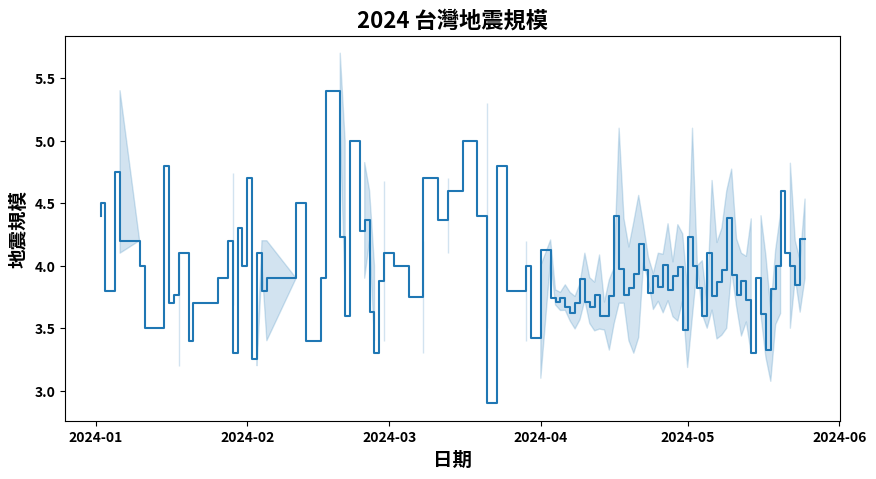

In [ ]:
# display the degree of earthquakes

plt.figure(figsize=(10, 5))
plt.title('2024 台灣地震規模',fontsize=16)

sns.lineplot(data=df,x='Date',y='規模',
             drawstyle='steps-pre');
plt.xlabel('日期',size=14)
plt.ylabel('地震規模',size=14);


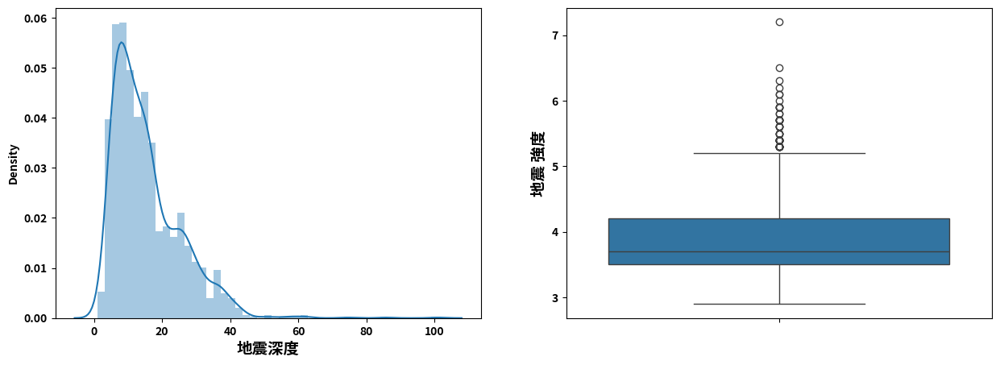

In [ ]:
# Simple Statistics of Earthquakes

plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)
sns.distplot(df['深度'])
plt.xlabel('地震深度',size=14)

plt.subplot(1, 2, 2)
sns.boxplot(df['規模'])
plt.ylabel('地震 強度',size=14);

In [ ]:
# Visualize the data by plotly
fig = px.scatter_geo(df, lat='緯度',
                     lon='經度',
                     color="規模",
                     fitbounds='locations',
                     scope='asia')
fig.show()

Map
---
To rough to make map via `plotly`, let use introduce by another professional package, `folium`.

In [ ]:
# Center of data occurences

[lat,lng]=[df['緯度'].mean(),df['經度'].mean()]

In [ ]:
tw_coord = [lat,lng]
# init the location and size of map
tw_map = folium.Map(location=tw_coord, zoom_start=8)

HeatMap(data=df[['緯度', '經度', '規模']], radius=10).add_to(tw_map)

for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['緯度'], row['經度']],
        radius=row['規模']/10,
        color='red', opacity=0.1,
        fill_color='orange').add_to(tw_map)

tw_map

Animated w.r.t. Date
---

In [ ]:
from folium.plugins import TimestampedGeoJson

In [ ]:
# Ordered the data by date

df.sort_values(by='Date', inplace=True)
df.reset_index(drop=True, inplace=True)

In [ ]:
df['date']=df['Date'].astype(str)


Create json Data
--
each data is like as:
```
{ 'type': 'Feature',
  'geometry': {'type': 'Point',
                'coordinates': [121.571, 23.2363]},
  'properties': {'time': Timestamp('2024-01-02 00:00:00'),
  'style': {'color': 'red'},
  'icon': 'circle',
  'iconstyle': {'fillOpacity': 0.1,
  'opacity': 0.3,
  'weight': 1,
  'radius': 2.2}}}
   ```

In [ ]:
import datetime
def create_geojson_features(df):
    features = []

    for _, row in df.iterrows():
        feature = {
            'type': 'Feature',
            'geometry': {
                'type':'Point',
                'coordinates':[row['經度'],row['緯度']]
            },
            'properties': {
                'time': row['地震時間'].isoformat(),
                'style': {'color' : 'red'},
                'icon': 'circle',
                'iconstyle':{
                    #'fillColor': row['fillColor'],
                    'fillOpacity': 0.1,
                    'opacity': 0.3,
                    'weight': 1,
                    #'stroke': 'true',
                    'radius': row['規模']/2,
                    #'radius': row['count'] + 5
                }
            }
        }
        features.append(feature)
    return features

In [ ]:
df_geojson = create_geojson_features(df)
#df_geojson[0]

In [ ]:
tw_anim = folium.Map(location = tw_coord,
                    titles = "Taiwan EarthQuake 2024",
                    zoom_start = 8)

TimestampedGeoJson(df_geojson,
                  transition_time = 100,
                  #auto_play = True
                  ).add_to(tw_anim)
tw_anim

Group for Time and Location
---

In [ ]:
df['Week'] = df['地震時間'].dt.to_period('W')
grouped = df.groupby('Week').agg({
    '緯度': 'mean',
    '經度': 'mean',
    '規模': 'mean'
}).reset_index()

In [ ]:
grouped.head(2)

,Week,緯度,經度,規模
0,2024-01-01/2024-01-07,23.974340,121.950800,4.440000
1,2024-01-08/2024-01-14,23.871867,121.632667,4.133333


In [ ]:
from sklearn.decomposition import PCA

features = df[['緯度', '經度', '規模']]
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features)
df['PC1'] = principal_components[:, 0]
df['PC2'] = principal_components[:, 1]

In [ ]:
import folium
from folium.plugins import HeatMap

m = folium.Map(location=[df['緯度'].mean(), df['經度'].mean()], zoom_start=8)
HeatMap(data=df[['緯度', '經度', '規模']], radius=15).add_to(m)

for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['緯度'], row['經度']],
        radius=row['規模'],
        color='red', opacity=0.1,
        fill=True,
        fill_opacity=0.7
    ).add_to(m)




In [ ]:
m

In [ ]:
from folium.plugins import TimestampedGeoJson

def create_geojson_features(df):
    features = []
    for _, row in df.iterrows():
        feature = {
            'type': 'Feature',
            'geometry': {
                'type': 'Point',
                'coordinates': [row['經度'], row['緯度']]
            },
            'properties': {
                'time': row['地震時間'].isoformat(),
                'style': {'color' : 'red','opacity':0.1},
                'icon': 'circle',
                'iconstyle': {
                    'fillOpacity': 0.3,
                    'radius': row['規模']
                }
            }
        }
        features.append(feature)
    return features

features = create_geojson_features(df)
tw_anim2 = folium.Map(location = tw_coord,
                    titles = "Taiwan EarthQuake 2024",
                    zoom_start = 8)

TimestampedGeoJson(
    {'type': 'FeatureCollection', 'features': features},
    #period='PT1H',
    add_last_point=True,
    auto_play=True,
    loop=False
).add_to(tw_anim2)

tw_anim2


In [ ]:
df['Latitude'] = df['緯度']
df['Longitude'] = df['經度']
df['Depth']=df['深度']
df['Magnitude']=df['規模']

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import folium
from folium.plugins import HeatMap


# Select Features and Apply PCA
features = df[['Latitude', 'Longitude', 'Depth']]
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features)
df['PC1'] = principal_components[:, 0]
df['PC2'] = principal_components[:, 1]

# Overlay Fault Line from PCA
pca_center = [df['Longitude'].mean(), df['Latitude'].mean()]
pc1_direction = pca.components_[0]
scale_factor = 0.1  # Adjust this value as needed
pc1_line = np.array(pca_center) + scale_factor * np.array([pc1_direction[1], pc1_direction[0]])


# Create a Folium Map
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

# Add Fault Line
folium.PolyLine([pca_center, pc1_line.tolist()], color="blue", weight=5, opacity=1).add_to(m)

# Add Earthquake Points
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=row['Magnitude'],
        color='red', opacity=0.1,
        fill=True,
        fill_opacity=0.7
    ).add_to(m)


# Save the Map
m.save('seismic_fault_line_map.html')


In [ ]:
df.head()

,編號,地震時間,經度,緯度,規模,深度,位置,Date,Time,date,Week,PC1,PC2
0,小區域有感地震,2024-01-02 23:05:58,121.571,23.2363,4.4,39.9,臺東縣政府東北方 68.5 公里 (位於臺灣東部海域)(臺灣東部海域),2024-01-02,23:0,2024-01-02,2024-01-01/2024-01-07,0.561708,0.566888
1,小區域有感地震,2024-01-03 09:43:33,121.515,23.6200,4.5,23.1,花蓮縣政府南南西方 42.5 公里 (位於花蓮縣豐濱鄉)(花蓮縣豐濱鄉),2024-01-03,09:4,2024-01-03,2024-01-01/2024-01-07,0.633465,0.332787
2,小區域有感地震,2024-01-05 12:13:38,121.858,24.4247,3.8,16.3,宜蘭縣政府南南東方 35.3 公里 (位於宜蘭縣近海)(宜蘭縣近海),2024-01-05,12:1,2024-01-05,2024-01-01/2024-01-07,-0.108939,-0.459767
3,小區域有感地震,2024-01-06 10:22:21,121.949,23.9472,4.1,39.4,花蓮縣政府東方 33.8 公里 (位於臺灣東部海域)(臺灣東部海域),2024-01-06,10:2,2024-01-06,2024-01-01/2024-01-07,0.225671,-0.194737
4,小區域有感地震,2024-01-06 00:58:07,122.861,24.6435,5.4,85.8,宜蘭縣政府東方 111.5 公里 (位於臺灣東部海域)(臺灣東部海域),2024-01-06,00:5,2024-01-06,2024-01-01/2024-01-07,1.502662,-1.366057


In [ ]:
m

In [ ]:
import numpy as np

In [ ]:
# Overlay Fault Line from PCA
pca_center = [df['經度'].mean(), df['緯度'].mean()]
pc1_direction = pca.components_[0]
scale_factor = 0.1  # Adjust this value as needed
pc1_line = np.array(pca_center) + scale_factor * np.array([pc1_direction[1], pc1_direction[0]])

# Add the fault line to the map
#folium.PolyLine([pca_center, pc1_line.tolist()], color="blue", weight=50, opacity=1).add_to(m)
folium.PolyLine([start_point, end_point.tolist()], color="blue", weight=5, opacity=1).add_to(m)

# Save the Map
m.save('seismic_fault_line_map.html')

NameError: name 'start_point' is not defined

In [ ]:
m

In [ ]:
folium.PolyLine([start_point, end_point.tolist()], color="blue", weight=5, opacity=1).add_to(m)
m1

In [ ]:
pca_center = [df['經度'].mean(), df['緯度'].mean()]
pc1_direction = pca.components_[0]
scale_factor = 0.5  # Adjust this value as needed
start_point = pca_center
end_point = np.array(start_point) + scale_factor * np.array([pc1_direction[1], pc1_direction[0]])

# Add the fault line to the map with increased width
folium.PolyLine([start_point, end_point.tolist()], color="blue", weight=5, opacity=1).add_to(m)


In [ ]:
m

In [ ]:
map_center = [df['緯度'].mean(), df['經度'].mean()]

m = folium.Map(location=map_center, zoom_start=5)

# Overlay Fault Line from PCA
pca_center = [df['緯度'].mean(), df['經度'].mean()]
pc1_direction = pca.components_[0]
scale_factor = 0.5  # Adjust this value as needed
start_point = pca_center
end_point = np.array(start_point) + scale_factor * np.array([pc1_direction[1], pc1_direction[0]])

# Add the fault line to the map with increased width
folium.PolyLine([start_point, end_point.tolist()], color="blue", weight=5, opacity=1).add_to(m)


In [ ]:
m

In [ ]:
df['PC1'] = principal_components[:, 0]
df['PC2'] = principal_components[:, 1]


In [ ]:
end_point

array([121.63227517,  24.00246299])

In [ ]:
df.head(2)

,編號,地震時間,經度,緯度,規模,深度,位置
0,小區域有感地震,2024-05-25 15:30:19,121.420,22.4425,4.2,21.3,臺東縣政府東南方 44.3 公里 (位於臺灣東南部海域)(臺灣東南部海域)
1,小區域有感地震,2024-05-25 13:30:50,121.674,24.2543,3.9,28.3,花蓮縣政府北北東方 29.7 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)


In [ ]:
df['地震時間']=pd.to_datetime(df["地震時間"])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1623 entries, 0 to 1399
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   編號      1623 non-null   object        
 1   地震時間    1623 non-null   datetime64[ns]
 2   經度      1623 non-null   float64       
 3   緯度      1623 non-null   float64       
 4   規模      1623 non-null   float64       
 5   深度      1623 non-null   float64       
 6   位置      1623 non-null   object        
dtypes: datetime64[ns](1), float64(4), object(2)
memory usage: 166.0+ KB


In [ ]:
df1=df.copy()
df1.rename(columns={'地震時間':'time','緯度':'latitude', '經度':'longitude','規模':'mag','深度':'deep'},inplace=True)

In [ ]:
df1.head(2)

,編號,time,longtitude,latitude,mag,deep,位置
0,小區域有感地震,2024-05-25 15:30:19,121.420,22.4425,4.2,21.3,臺東縣政府東南方 44.3 公里 (位於臺灣東南部海域)(臺灣東南部海域)
1,小區域有感地震,2024-05-25 13:30:50,121.674,24.2543,3.9,28.3,花蓮縣政府北北東方 29.7 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)


In [ ]:
df1.sort_values(by='time',inplace=True)
df1.head(2)

,編號,time,longtitude,latitude,mag,deep,位置
26,小區域有感地震,2024-01-02 23:05:58,121.571,23.2363,4.4,39.9,臺東縣政府東北方 68.5 公里 (位於臺灣東部海域)(臺灣東部海域)
25,小區域有感地震,2024-01-03 09:43:33,121.515,23.6200,4.5,23.1,花蓮縣政府南南西方 42.5 公里 (位於花蓮縣豐濱鄉)(花蓮縣豐濱鄉)


In [ ]:
df1.index=df1['time']
df1.drop(columns='time',inplace=True)

In [ ]:
df2=df1[['latitude','longtitude','mag','deep']].copy()


In [ ]:
loc=[df2['latitude'].mean(),df2['longtitude'].mean()]

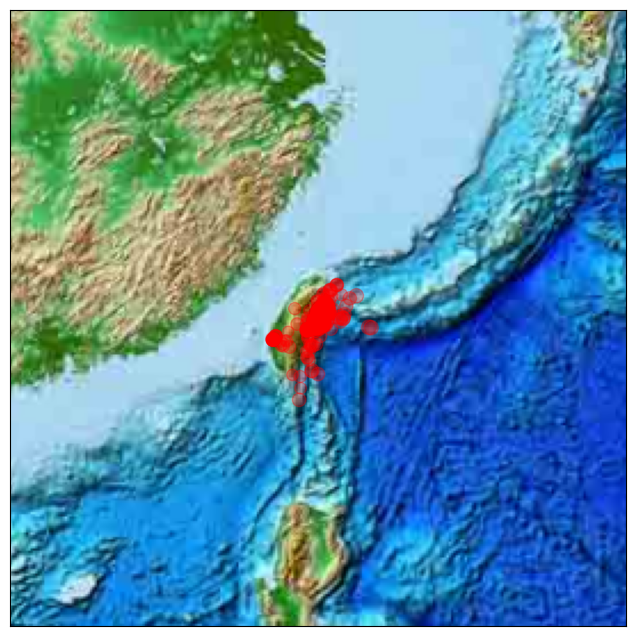

In [ ]:
fig = plt.figure(figsize=(8, 8))
m = Basemap(projection='lcc', resolution='h',
            lat_0=loc[0], lon_0=loc[1],
            width=2.0E6, height=2.0E6)

# m.bluemarble()
m.etopo()

m.drawstates(color='gray')
lon = list(df2["longitude"])
lat = list(df2["latitude"])

m.scatter(lon,lat, latlon=True,
#           c=color,
          s=df2['mag']/0.05,
          c = 'red',
#           cmap='YlGnBu_r',
          alpha=0.3)

m

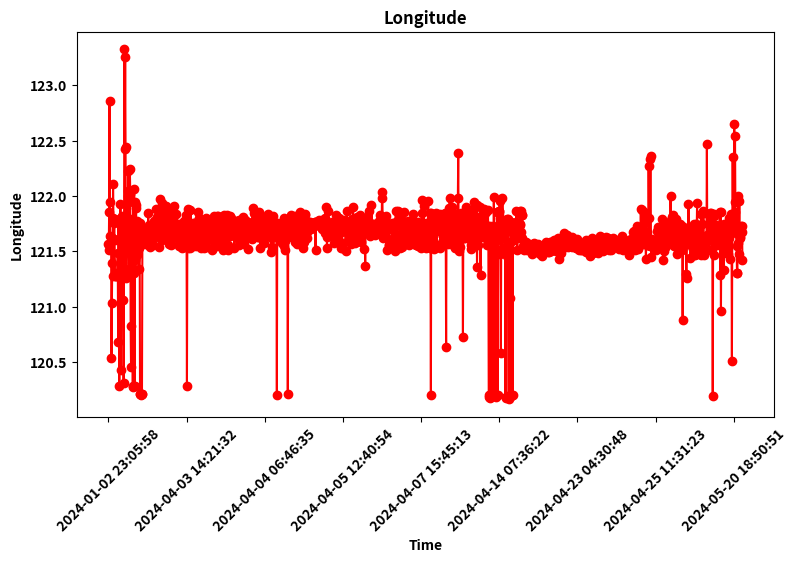

In [ ]:

# Pandas series with magnitudes greater than 6
plt.figure(figsize=(9,5))
df2["longtitude"].plot(style="ro-")

plt.title("Longitude")
plt.xlabel('Time')
plt.ylabel("Longitude");
plt.xticks(rotation=45);

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

df = df2.loc[:,["longtitude", "latitude", "deep"]]

ss = StandardScaler()
X_scaled = ss.fit_transform(df)

eps_param = 0.33
min_sample = 7

dbscan = DBSCAN(eps = eps_param, min_samples=min_sample)

db = dbscan.fit(X_scaled)

print(db)

DBSCAN(eps=0.33, min_samples=7)


In [ ]:
df.head(2)

,longtitude,latitude,deep
time,,,
2024-01-02 23:05:58,121.571,23.2363,39.9
2024-01-03 09:43:33,121.515,23.6200,23.1


In [ ]:
df['cluster'] = db.labels_

In [ ]:
import numpy as np
from sklearn import metrics


core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Total number of points: %d' % len(X_scaled))
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_scaled, labels))



Total number of points: 1623
Estimated number of clusters: 5
Estimated number of noise points: 113
Silhouette Coefficient: -0.131


In [ ]:
cluster_dict = dict(
                zip(
                    df.cluster.value_counts().keys(),
                    df.cluster.value_counts().values
                       )
                   )
print("Clusters: ", cluster_dict)

Top_clusters = df.cluster.value_counts().keys()


# Plotting the top cluster
if (Top_clusters[0] < 0):
    cluster_mask = Top_clusters[1]
else:
    cluster_mask = Top_clusters[0]

print("Top cluster is: ", cluster_mask)
dbb = db.core_sample_indices_

Clusters:  {0: 1452, -1: 113, 2: 27, 1: 15, 3: 9, 4: 7}
Top cluster is:  0


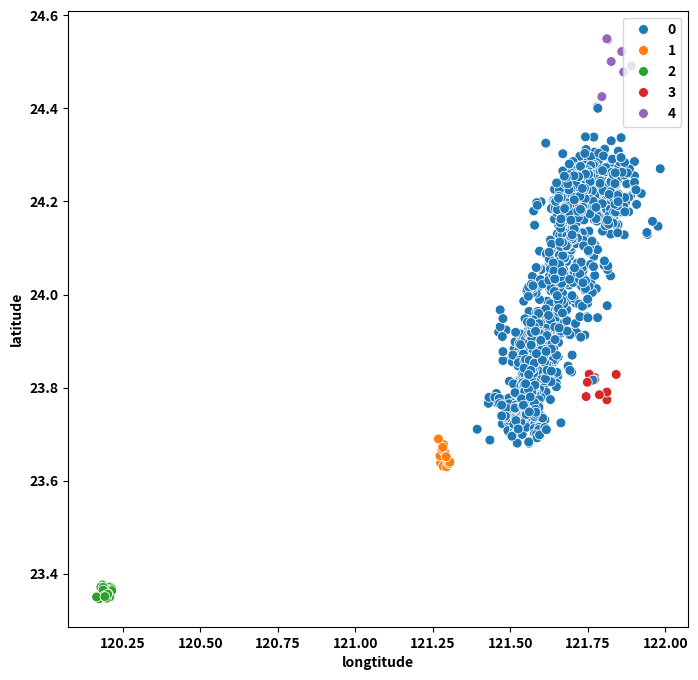

In [ ]:
plt.figure(figsize=(8,8))

sns.scatterplot(data = df[df["cluster"]!=-1], x = "longtitude", y = "latitude",
                hue = "cluster",
                s = 50,
                palette="tab10", legend = "full")


plt.legend(loc='upper right')

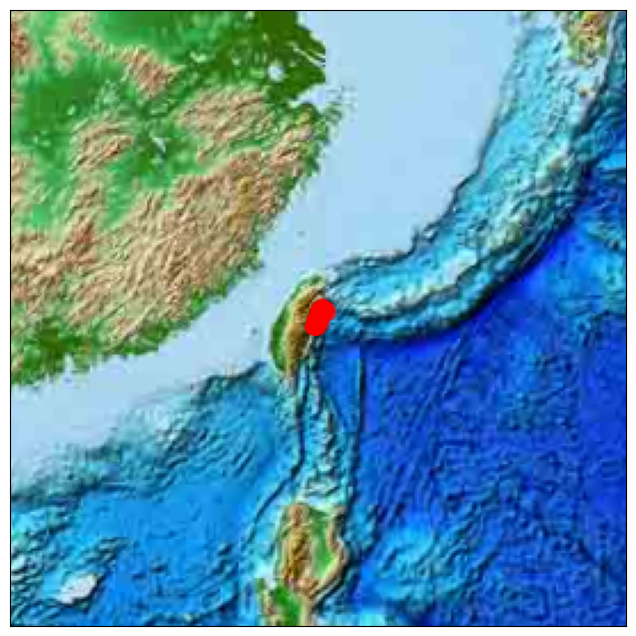

In [ ]:
df2["cluster"] = df['cluster']

df_top_cluster = df2[df2["cluster"] == cluster_mask]

fig = plt.figure(figsize=(8, 8))
m = Basemap(projection='lcc', resolution='h',
            lat_0=loc[0], lon_0=loc[1],
            width=2.0E6, height=2.0E6)

m.etopo()

m.drawstates(color='gray')


lon = list(df_top_cluster["longtitude"])
lat = list(df_top_cluster["latitude"])

m.scatter(lon,lat, latlon=True,
#           c=color,
          s=df_top_cluster['mag']/0.05,
          c = 'red',
#           cmap='YlGnBu_r',
          alpha=0.3)
